# Loading and preprocessing the data

Before analysing, classifying and transforming data you need to load it. 
It is also important to get a feel for the data: 

* what format is it in? 
* wehat recognisable features does it have?

In this module, you will use Python and the spaCy library to load, explore and manipulate textual data.
Whilst loading, exploring and manipulating, you will also learn a few NLP concepts.

## Loading the data

For the sentiment analysis task, you will work with a subset of the [Large Movie Review Dataset](http://ai.stanford.edu/~amaas/data/sentiment/). 
The original collection contains $50000$ highly polar movie reviews scraped from the [IMDB](http://www.imdb.com) website, converted into plain text format and annotated for sentiment polarity by researchers from Stanford University. 
To speed up processing, you will only use the first $1000$ positive and negative reviews from the training subset of the original dataset.

The `imdb_dataset/` directory contains $1000$ positive reviews in subdirectory `pos/` and $1000$ negative reviews in subdirectory `neg/`. This makes the positive to negative reviews proportion exactly $50\%$. But before implementing a sentiment detector, you will start with loading the data.

Let's first define a function that iterates through a directory `dir` and reads its files one by one.
The result is a **dictionary** that associates each file name (key) with its content (value).


In [15]:
## Test
import matplotlib
import sklearn
import spacy
import en_core_web_sm
import en_core_web_md

In [16]:
import os

def init_dict(a_dir):
    a_dict = {}
    file_list = os.listdir(a_dir)
    for a_file in file_list:
        f = open(a_dir + a_file, 'r')
        a_dict[a_file] = f.read()
        f.close()
    return a_dict

In [4]:
#dict_tst = {}
#dict_tst['xxx'] = 'xisxisxis'
#dict_tst['www'] = 'dabliudabliudabliu'
#dict_tst

This function takes a directory name (e.g., `data/imdb_dataset/pos/`) as an argument. It finds the names of all the directory's files and stores them in a list called `file_list`. 
It then iterates over the files, loading their content and storing them in the dictionary `dict`.

Next, you can have a look at the data loaded by your Python program. 
Add a function `print_dict` that displays the contents of a Python dictionary:


In [17]:
def print_dict(a_dict, maxn=5):
    for key in sorted(a_dict.keys()):
        print (key, ":\n" , a_dict.get(key))

Now you can check that everything works and have a look, for example, at the positive movie reviews:


In [18]:
# add your code here
pos = init_dict("data/imdb_dataset/pos/")
print_dict(pos)


0_9.txt :
 Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High's satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I'm here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn't!
100_7.txt :
 Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lights and colours, and th

606_10.txt :
 I have seen a lot of Saura films and always found amazing the way he assembles music, dance, drama and great cinema in his movies. IbÃ©ria shows an even better Saura, dealing with multimedia concepts and a more contemporary concept of dance and music. Another thing that called my attention is the fact that, in this movie, dancers and musicians, dance and music, are equally important: the camera shows various aspects of music interpretation, examining not only technical issues but also the emotional experience of playing. The interest of Saura on the bridge between classical and contemporary music and dance is one more ingredient in turning this movie maybe the most aesthetically exciting among his other works. That's why I recommend it strongly to those who love good cinema, good music, good dance, great art.
607_10.txt :
 Maybe I loved this movie so much in part because I've been feeling down in the dumps and it's such a lovely little fairytale. Whatever the reason, I th

Initialise `neg` for negative reviews in a similar way:

In [19]:
pos

{'0_9.txt': 'Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High\'s satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers\' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I\'m here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn\'t!',
 '100_7.txt': "Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lights and colou

In [20]:
# add your code here if you want to have a look at the negative reviews
neg = init_dict("data/imdb_dataset/neg/")
print_dict(neg)

0_3.txt :
 Story of a man who has unnatural feelings for a pig. Starts out with a opening scene that is a terrific example of absurd comedy. A formal orchestra audience is turned into an insane, violent mob by the crazy chantings of it's singers. Unfortunately it stays absurd the WHOLE time with no general narrative eventually making it just too off putting. Even those from the era should be turned off. The cryptic dialogue would make Shakespeare seem easy to a third grader. On a technical level it's better than you might think with some good cinematography by future great Vilmos Zsigmond. Future stars Sally Kirkland and Frederic Forrest can be seen briefly.
100_3.txt :
 OK its not the best film I've ever seen but at the same time I've been able to sit and watch it TWICE!!! story line was pretty awful and during the first part of the first short story i wondered what the hell i was watching but at the same time it was so awful i loved it cheap laughs all the way.  And Jebidia deserves 

 This film has got several key flaws. The first and most significant of which is the clear lack of a good plot! This sadly makes the film not only difficult to watch but also sends the watcher certain feelings of hopelessness, as if he or she is wasting valuable time of their short life. This means that the film cannot captivate it's audience, instead it encourages the viewing public to grow contempt for the film and everything associated with it! In short, it really is very very very very very very very BAD! Do yourself a favour and chew on a large rubber shoe, you'll find it far more interesting and enjoyable than watching Terminator Woman.
722_4.txt :
 One scene demonstrates the mentality of "Terminator Woman" pretty well: Karen Sheperd and another woman are trying to escape from the villain's camp. Karen runs across an armed guard, who points his gun at her, but after a few seconds throws it away and challenges her to a fight. Karen kicks him in the balls, picks up the gun and runs

**Note:**

Sometimes, it is easier to get files directly from the web – for example, if the data changes frequently and you want to always analyse the most recent available set. 
In this case, you can use the following code, changing the `url` variable to load your own text.

For this, you can use the `requests` library 

* import `requests`
* consider the URL `http://www.gutenberg.org/files/1024/1024.txt` and retrieve it using `requests.get()`
* the returned object has a `.text` field which contains the raw content of the page.

In [7]:
# add your code here
import requests

url = "http://www.gutenberg.org/files/1024/1024.txt"
raw = requests.get(url).text


Then you can use `raw` as you would any string.
Show the length of the string as well as the first 75 characters. 

In [8]:
# add your code here
print(type(raw))
print(len(raw))
print(raw[:75])


<class 'str'>
799376
Project Gutenberg's The Wrecker, by Robert Louis Stevenson and Lloyd Osbour


## Preprocessing

The text, loaded from each of the files, comes as a single sequence of symbols (a string of characters).
To simplify future operations – such as searching by keywords – you can preprocess the text.

### Tokenisation

The first preprocessing step is *tokenisation*: splitting the text into words.

**Quiz:**

>How can you split the text in words?

**Answer:**

>By whitespace, punctuation marks, or both.

Each of these ways of chunking text gives slightly different results.

For example, if you split this sentence by whitespace it gives you: 

```
["For", "example,", "if", "you", "split", …]
```

This is good enough, except for the fact that “example” and the following comma "," are represented as if they constitute one word `"example,"`.
To avoid this, you will need to **split** by both whitespaces and punctuation marks to produce the list 

```
["For", "example", ",", "if", "you", "split", …]
```

However, this approach comes with its own issues.
Consider the words “U.S.A.” or “Mr.”: they should not be split even though they contain punctuation.

Additionally, different languages have different notions of what a word is.

![Sample of some Asian languages](figures/multi-language-sample.jpg)

Luckily, there are NLP tools – *tokenisers* – that have solutions for these issues.
They work around the issues listed above and a few more.

Throughout this tutorial, you will be using [`spaCy`](https://spacy.io) for text processing, so the first thing you need to do is load its functionality with an import statement. `spaCy` builds a pipeline of a range of preprocessing tools, including a tokeniser. In order to make use of these, you need to load the English suite of tools with `spacy.load(_language_)`, create an `nlp` object and pass the input text to it, as follows:

**Note**: you may have to do 

* `python -m spacy download en` and 
* `pip install plac==0.9.1`

in order to be able to do `spacy.load('en')`



In [10]:
import spacy
#################nlp = spacy.load('en') ####################### ?????????????????
nlp = spacy.load('en_core_web_sm')



text = nlp(u'Each of these ways gives slightly different results. For example, if you split this sentence...')
for i in range(len(text)):
    token = text[i]
    print(token)

# Print sentences (one sentence per line)
for sent in text.sents:
    print(sent)

Each
of
these
ways
gives
slightly
different
results
.
For
example
,
if
you
split
this
sentence
...
Each of these ways gives slightly different results.
For example, if you split this sentence...


**Note:**
>Loading the language tools might take a bit of time, but once the pipeline is initialised the processing goes reasonably quickly.


### Capitalisation

Another peculiarity of language that you need to learn about is *capitalisation*.
In certain scenarios, you might be interested in keeping the original capitalisation of words in text – for example, to detect proper nouns.
However, for most NLP applications, including the ones you will look into during this course, capitalisation does not matter.
In Python, you can switch all characters in a string to lower case using the `lower` method.

**Tasks**:
* With `nlp`, read the sentence `u"For Example, IF you Split this Sentence bY Whitespace it Gives You"` (`u` is for "unicode" input which is required by SpaCy)
* Go over the resulting data structure, retrieve the token, lower it and print the result.

In [11]:
# add your code here
text = nlp(u'For Example, IF you Split this Sentence bY Whitespace it Gives You')
for token in text:
    print(str(token).lower())
    # uncomment this if you want to see the "lemma" (see explanations below)
    print("lemma: {}".format(token.lemma_))


for
lemma: for
example
lemma: example
,
lemma: ,
if
lemma: if
you
lemma: -PRON-
split
lemma: split
this
lemma: this
sentence
lemma: sentence
by
lemma: by
whitespace
lemma: whitespace
it
lemma: -PRON-
gives
lemma: give
you
lemma: -PRON-


Note that different languages, once again, have different notions of capitalisation. Even in English, the rules are complicated: the pronoun “I” is a special case and adjectives based on proper nouns are capitalised (“the English language”).


### Lemmatisation

Consider searching your database of movie reviews for “movie”: you want to see in the results both “_Movies_ by this director are always worth watching on a big screen” and “This _movie_ was excellent”.
The search algorithm needs to not only ignore capitalisation, but also link plurals to the singular forms.

In NLP applications, words are converted to a single representation: a **lemma**.
The lemmas for “movie”, “movies”, “Movie”, and “Movies” are all the same; as a result, searching for either form will let you find any of the others.
Other interesting cases are verbs: “show”, “showed”, “shown” and “shows” all share the same lemma.

Once again, different languages have different lemmatisation techniques and word forms. 
For example, French adjectives carry gender information.

Many NLP tools let you transform a word into its lemma, using a *lemmatiser*.
Essentially, a lemmatiser tries to convert different word forms to their base representations (lemmas) by looking up whether the lemma is in the vocabulary of the language in question.
In this course, you will use the lemmatiser that is part of the `spaCy` NLP pipeline.
`spaCy` makes the use of lemmatiser extremely easy: you simply need to access the `lemma_` field of the `token` object. Let's define the function `preprocess` that subsumes all the preprocessing steps:


In [12]:
def preprocess(sentence, lemmatise):
    text = nlp(sentence)
    if lemmatise=="on":
        lemmas = [token.lemma_ for token in text]
        return lemmas
    else:
        tokens = [str(token).lower() for token in text]
        return tokens
                                            
print(preprocess(u"For Example, IF you Split this Sentence bY Whitespace it Gives You", "on"))
print(preprocess(u"For Example, IF you Split this Sentence bY Whitespace it Gives You", "off"))

['for', 'example', ',', 'if', '-PRON-', 'split', 'this', 'sentence', 'by', 'whitespace', '-PRON-', 'give', '-PRON-']
['for', 'example', ',', 'if', 'you', 'split', 'this', 'sentence', 'by', 'whitespace', 'it', 'gives', 'you']


**Note**:
>`-PRON-` stands for pronoun and covers a wide class of words including "_I_", "_you_", "_this_", etc.

Note that the code uses Python's [list comprehensions](https://treyhunner.com/2015/12/python-list-comprehensions-now-in-color/) to define the value of `lemmas`. Note also that if you use lemmatiser you don't need to explicitly convert tokens to lowercase as `spaCy` pipeline does this conversion for you internally. However, if you don't want to convert original word tokens to their lemmas and you don't apply a lemmatiser, you need to convert the tokens to lower case. The code above has the flexibility which might come in handy in later applications.


### Part of Speech Tagging

Another NLP preprocessing step is concerned with assigning words to particular classes by the function that they typically serve in language. For example, words that denote objects and people/animals usually belong to the class of _nouns_ (e.g., _movie_ or _actor_), actions are typically expressed by _verbs_ (e.g., _shoot_ and _perform_), and qualities by _adjectives_ (e.g., _good_ and _bad_). The task of assigning the classes to words is called _Part of speech (PoS) tagging_. In practice, and especially for English which is not rich in morphology and inflections that can give additional clues to a PoS tagger, the task might become quite tricky: e.g., _show_ may be a noun as in "_late-night show_" or a verb as in "_they show it late at night_". PoS tagging is typically approached as a machine learning task and the tag prediction relies on statistics.

A number of applications might benefit from PoS tagging: for example, adjectives (e.g., _good_) and adverbs (e.g., _badly_) bear stronger sentiment than words of other parts of speech (e.g., _actor_ or _perform_). You might consider this when you implement your own sentiment analyser.

`spaCy` allows to "PoS-tag" words on the go – it is part of the NLP pipeline. To get the PoS tags, simply access the `pos_` field of the tokens.

Try to do that on the same sentence as the one you tried above. 


In [13]:
# your code here
text = nlp(u'For Example, IF you Split this Sentence bY Whitespace it Gives You')
for token in text:
    print(str(token).lower())
    print("> Pos: {}".format(token.pos_))


for
> Pos: ADP
example
> Pos: PROPN
,
> Pos: PUNCT
if
> Pos: ADP
you
> Pos: PRON
split
> Pos: VERB
this
> Pos: DET
sentence
> Pos: PROPN
by
> Pos: ADP
whitespace
> Pos: PROPN
it
> Pos: PRON
gives
> Pos: VERB
you
> Pos: PRON


**Note:**
>If you find the abbreviated tag representation confusing, use the `spaCy` [help page](https://spacy.io/docs/api/annotation#pos-tagging-english).


### Summary

To summarise, within the NLP preprocessing pipeline data is typically first loaded, then chunked (tokenised), and then normalised (made lowercase and lemmatised). Depending on the application, you might want to further process the data, for example, apply PoS tagging.

![Preprocessing pipeline](figures/pipeline.png)

Toolkits like `spaCy` make a number of these preprocessing steps easy to run.


## Inspecting the data

Now that the data is prepared, you can search through it and get a feel for what it contains.

First, define a function `context_search` that takes a file dictionary (e.g. `pos` or `neg`) and a keyword (e.g., “fabulous” or "brrr") as input, and prints the contexts where that keyword appears. To speed up the processing, let's also allow the function to iterate through a selected set of documents (e.g., the first $100$ ones with `span=100`), and for the sake of readability, let's output the search word in upper case letters, and let's also specify the length of the surrouding context (e.g., up to $10$ words on each side, subject to the overall length of text, with `context_length=10`).


In [14]:
def context_search(file_dict, span, search_word, context_length):
    for a_file in list(file_dict.keys())[:span]: 
        # either get lemmas ("on") or lowercased tokens ("off")
        word_list = preprocess(file_dict.get(a_file), "off")
        # note the use of list comprehensions
        positions = [i for i in range(len(word_list)) if search_word==word_list[i]] 
        if len(positions)>0:
            print ("\n" + a_file)
            for pos in positions:
                # print (positions)
                output = [word_list[i] for i in range(max(0, (pos-context_length)), pos)]
                output.append(word_list[pos].upper())
                output+=[word_list[i] for i in range(pos+1, min(len(word_list), (pos+context_length+1)))]
                print(' '.join(output))

                
print("FABULOUS IN FIRST 700 POSITIVE REVIEWS:")
print(context_search(pos, 700, "fabulous", 10))

print("---------------------------------------")
print("FABULOUS IN FIRST 700 NEGATIVE REVIEWS:")
print(context_search(neg, 700, "fabulous", 10))

print("-----------------------------------")
print("BRRR IN FIRST 700 POSITIVE REVIEWS:")
print(context_search(pos, 700, "brrr", 10))

print("-----------------------------------")
print("BRRR IN FIRST 700 NEGATIVE REVIEWS:")
print(context_search(neg, 700, "brrr", 10))

FABULOUS IN FIRST 700 POSITIVE REVIEWS:

19_10.txt
era actions , but personal feelings apart , she is FABULOUS in this role . robert deniro is superb as a

263_9.txt
the singular exception of the five little pigs which was FABULOUS in plot , character and theme , the longer poirot

28_10.txt
talents and inventively gory murder sequences . it 's a FABULOUS giallo ( released in the golden year 1972 ) that

35_8.txt
apart , however , the film is a dream . FABULOUS ladies in fabulous outfits in wonderful settings and the whole
, the film is a dream . fabulous ladies in FABULOUS outfits in wonderful settings and the whole thing constantly on

370_10.txt
incredible but came alive by spielberg 's expertise and the FABULOUS cast including whoopi goldberg , oprah winfrey , danny glover

385_10.txt
a travesty and an insult .   whoopi goldberg is FABULOUS as the tortured celie , an unattractive woman given away

615_10.txt
, and a perfect fairytale ending make this film absolutely FABULOUS ! i 'm

### Closer look into the data

You now know how to look up the contexts surrounding specific words.
However, this is of limited use: which words should you look up in the first place? What other characteristics differentiate positive reviews from negative ones?

One way to explore the differences is to estimate how diverse the words used in positive and negative reviews are.

Define a function `word_count(file_dict)` that, for a specific file dictionary `file_dict`, calculates basic statistics about its textual content: total number of words, total number of distinct words, and the proportion between the two.
The ratio of unique words to total words indicates how diverse the language used in the dictionary is.
It is known as the _lexical richness_ and is estimated as 
<h4><center>$LR = \frac{types}{tokens} \times 100\%$</center></h4>
where we refer to distinct words (without repetitions) as _types_ and to all words including repetitions as _tokens_.


In [15]:
def word_count(file_dict):
    total_length = 0
    unique_words = []
    for a_file in file_dict.keys():
        text_list = preprocess(file_dict.get(a_file), "on")
        total_length = total_length + len(text_list)
        unique_words = unique_words + text_list
    print ("Total length " + str(total_length))
    unique_words_set = set(unique_words)
    print ("Unique words " + str(len(unique_words_set)))
    lexical_richness = 100 * round(float(len(unique_words_set))/float(total_length), 4)
    print ("Lexical richness " + str(lexical_richness) + "%")

Note that the `set` operator removes all duplicates. Now call this function on your data:

In [16]:
# add your code here
print ("\nPositive reviews:")
word_count(pos)
print ("\nNegative reviews:")
word_count(neg)



Positive reviews:
Total length 272892
Unique words 13525
Lexical richness 4.96%

Negative reviews:
Total length 272791
Unique words 13795
Lexical richness 5.06%


Note that positive and negative vocabularies are quite similar in terms of their lexical richness, with the negative reviews vocabulary being slightly (by about $0.1\%$) richer. 

You can explore the vocabulary further: define a function `vocabulary(file_dict, range)` that, for a given file dictionary `file_dict`, collects all the unique words from its files.
To speed the processing up, the parameter `range` limits the number of files that the function analyses.
Note that you can always set this parameter to `len(file_dict.keys())` so the function iterates through all the files.


In [17]:
########## SET function --- creates a SET, therefore have only UNIQUE elements!!!!
x = [1, 1, 2, 2, 2, 2, 2, 3, 3]
set(x)


{1, 2, 3}

In [18]:
def vocabulary(file_dict, a_range):
    vocab = []
    for a_file in sorted(set(file_dict.keys()))[:a_range]:        
        text_list = preprocess(file_dict.get(a_file), "on")
        vocab = vocab + text_list
    return sorted(set(vocab))

You can use this function to detect which words appear in one dictionary but not the other.
To that end, write a function `non_overlapping` that takes two dictionaries and prints out the words that are unique to each.


In [20]:
def non_overlapping(pos_dict, neg_dict):
    pos_vocab = vocabulary(pos_dict, 100)
    neg_vocab = vocabulary(neg_dict, 100)
    unique_pos = [word for word in pos_vocab if not word in neg_vocab]
    unique_neg = [word for word in neg_vocab if not word in pos_vocab]

    print ("\nUnique positive words:")
    print (sorted(unique_pos)[-100:])
    print ("\n\nUnique negative words:")
    print (sorted(unique_neg)[-100:])

The function first collects the vocabulary from each dictionary and then computes the set difference of those. Finally, it prints a summary (limited to $100$ elements) from each. Try this code:
    

In [21]:
non_overlapping(pos, neg)


Unique positive words:
['utopian', 'vagabond', 'vaguely', 'vail', 'vapid', 'variation', 'vehicle', 'vehicular', 'verger', 'vice', 'victoria', 'victory', 'videotape', 'vidor', 'viewing', 'vigor', 'villarona', 'villaronga', 'vindicate', 'vintage', 'violently', 'virtuosic', 'visceral', 'von', 'voodoo', 'vortex', 'vosloo', 'vs', 'vulnerable', 'vã¸rsel', 'wage', 'waitress', 'wake', 'wallet', 'wanna', 'ward', 'warming', 'warp', 'wars', 'washington', 'watcher', 'water', 'waterbury', 'wave', 'waves', 'wealth', 'web', 'weigh', 'welcome', 'werewolf', 'werewolves', 'whenever', 'whereas', 'whitehouse', 'whitewash', 'whomever', 'whooo', 'wickedly', 'wide', 'widely', 'widower', 'wield', 'wildcats', 'william', 'willing', 'windsor', 'wine', 'wink', 'winner', 'winter', 'wise', 'wiseman', 'wit', 'witness', 'wives', 'wonderfully', 'worker', 'worried', 'worry', 'worthy', 'wound', 'wreckage', 'wrench', 'wrinkle', 'ww2', 'wwii', 'yacht', 'yale', 'yearn', 'yella', "you'll", 'yummy', 'zaku', 'zany', 'zentrop

### Optional extension: Collect specialised vocabulary

We noted above that PoS tags might be useful for later applications: for example, adjectives like _fabulous_ or _horrendous_ bear stronger sentiment than nouns like _movie_ or verbs like _perform_. So far, you've only learned how to access PoS information. Now, let's put this knowledge into use.

First of all, let's preprocess the texts, as before, extracting either lower-cased words or their lemmas, but this time filtering the words by their PoS:


In [22]:
def preprocess_pos(sentence, lemmatise, pos):
    text = nlp(sentence)
    # Add flexibility to your program – either get the lowercased tokens or lemmas
    if lemmatise=="on": 
        return [token.lemma_ for token in text if token.pos_==pos]
    else:
        return [str(token).lower() for token in text if token.pos_==pos]
                                            
print("Adjectives:")
print(preprocess_pos("This is an extremely good example of a very simple sentence", "on", "ADJ"))
print("Adverbs:")
print(preprocess_pos("This is an extremely good example of a very simple sentence", "on", "ADV"))
print("Nouns:")
print(preprocess_pos("This is an extremely good example of a very simple sentence", "on", "NOUN"))
print("Verbs:")
print(preprocess_pos("This is an extremely good example of a very simple sentence", "off", "VERB"))

Adjectives:
['good', 'simple']
Adverbs:
['extremely', 'very']
Nouns:
['example', 'sentence']
Verbs:
['is']


Next, let's collect a vocabulary of adjectives from positive and negative reviews and extract the non-overlapping ones:


In [24]:
def vocabulary(file_dict, a_range):
    vocab = []
    for a_file in list(file_dict.keys())[:a_range]:
        text_list = preprocess_pos(file_dict.get(a_file), "on", "ADJ")
        vocab = vocab + text_list
    return sorted(set(vocab))

def non_overlapping(pos_dict, neg_dict):
    pos_vocab = vocabulary(pos_dict, len(pos_dict))
    neg_vocab = vocabulary(neg_dict, len(neg_dict))
    unique_pos = [word for word in pos_vocab if not word in neg_vocab]
    unique_neg = [word for word in neg_vocab if not word in pos_vocab]

    print ("\nUnique positive words:")
    print (sorted(unique_pos)[:100])
    print ("\n\nUnique negative words:")
    print (sorted(unique_neg)[:100])
    
non_overlapping(pos, neg)


Unique positive words:
['12th', '18th', '24th', '6-part', '6-year', '7th', '8pm', '8th', '9/10-', 'aborted', 'abscond', 'accelerated', 'accessible', 'acclaimed', 'acidic', 'acrimonious', 'acrobatic', 'acted', 'acting-', 'actors(ie', 'adamant', 'administrative', 'admired', 'adolescent', 'advanced', 'affable', 'affluent', 'after', 'after-', 'aghast', 'ahhh', 'alaskan', 'albanian', 'albã', 'alienated', 'allegorical', 'allied', 'almighty', 'aloof', 'altered', 'alternative', 'ambidexterous', 'amicable', 'amiss', 'amoral', 'amused', 'anarchic', 'anarchy', 'ancillary', 'anesthetic', 'anglo', 'anguished', 'animatronic', 'appreciable', 'appreciated', 'apt', 'arcane', 'archetypical', 'ardent', 'arduous', 'aristotelian', 'armani', 'arnold', 'arrange', 'artisanal', 'assorted', 'astrological', 'attached', 'attuned', 'audacious', 'audiovisual', 'aussie', 'austere', 'authentic.this', 'authoritarian', 'autopsy', 'avante', 'avaricious', 'avenging', 'averse', 'avian', 'avuncular', 'awarded', 'away', 'a

Do you see any interesting examples of positive and negative adjectives?



## Frequency counts and visualisation

Another way to explore data is to build graphics to represent different aspects of a dataset. These graphics let you explore the dataset visually.

Let's collect word frequency statistics for the data:


In [26]:
import operator

def collect_word_map(file_dict):
    word_map = {}
    for a_file in file_dict.keys():
        # Either extract all words, or only some selected ones, e.g. adjectives
        # word_list = preprocess(file_dict.get(a_file), "on")
        word_list = preprocess_pos(file_dict.get(a_file), "on", "ADJ")
        for a_word in word_list:
            word_map[a_word] = word_map.get(a_word, 0) + 1
    return word_map

# Let's sort the word frequency map by word counts, 
# starting from the biggest count (reverse order), 
# and print up to 10 most frequent words
word_map = collect_word_map(pos)
sorted_map = (sorted(word_map.items(), key=operator.itemgetter(1)))[::-1]
print(sorted_map[:10])

[('-PRON-', 3515), ('good', 1071), ('that', 924), ('great', 532), ('which', 481), ('other', 422), ('more', 350), ('many', 297), ('first', 277), ('all', 232)]


In [27]:
word_map

{'same': 169,
 'other': 422,
 'such': 203,
 '-PRON-': 3515,
 'close': 35,
 'insightful': 3,
 'pathetic': 2,
 'whole': 86,
 'which': 481,
 'high': 118,
 'classic': 68,
 'many': 297,
 'fetched': 3,
 'pure': 33,
 'full': 81,
 'frontal': 4,
 'first': 277,
 'true': 116,
 'avante': 1,
 'human': 61,
 'emotional': 40,
 'biological': 1,
 'industrial': 9,
 'modern': 36,
 'sharp': 16,
 'vivid': 5,
 'grainy': 3,
 'correct': 9,
 'public': 10,
 'reminiscent': 10,
 'brisk': 1,
 'amiss': 1,
 'fragmented': 1,
 'much': 190,
 'free': 14,
 'extraterrestrial': 1,
 'disjointed': 4,
 'alien': 4,
 'bizarre': 10,
 'familiar': 36,
 'that': 924,
 'coherent': 4,
 'all': 232,
 'irreversible': 1,
 'excellent': 122,
 'interesting': 120,
 'abstract': 2,
 'small': 79,
 'saturated': 1,
 'psychedelic': 3,
 'compelling': 23,
 'beautiful': 139,
 'several': 60,
 'different': 112,
 'experimental': 4,
 'most': 174,
 'available': 23,
 'surprised': 36,
 'organic': 2,
 'bad': 159,
 'electronic': 3,
 'impressive': 24,
 'distress

**Note**:
>Note, that as `-PRON-` stands for pronoun and covers a wide class of words including "_my_", "_your_", "_this_", etc., combined, these words account for the largest number of items in text.

Let's visualise the frequency of the words as a scatter plot and locate some of the most frequent words on the graph. For example, _good_ is the second most frequent adjective in the positive reviews. Feel free to explore statistics for other words using the code below:


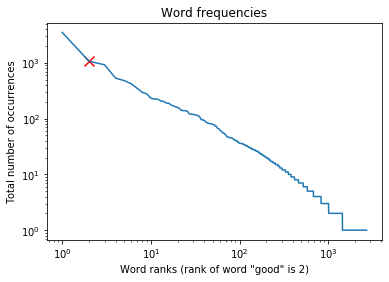

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline

# Based on https://www.digitalocean.com/community/tutorials/how-to-graph-word-frequency-using-matplotlib-with-python-3
def visualise(word_map, word):
    sorted_map = (sorted(word_map.items(), key=operator.itemgetter(1)))[::-1]
    occurrences = []
    ranks = []
    word_rank = 0
    word_frequency = 0

    # Find the rank and overall frequency of the word
    rank = 1
    for item in sorted_map:
        if (item[0] == word):
            word_rank = rank
            word_frequency = item[1]

        ranks.append(rank)
        rank += 1
        occurrences.append(item[1])

    # Plot word frequences against their ranks
    # Mark the word with red x
    plt.title("Word frequencies")
    plt.ylabel("Total number of occurrences")
    plt.xlabel("Word ranks (rank of word \"" + word + "\" is " + str(word_rank) + ")")
    # Logarithms help present the frequency/rank information concisely
    plt.loglog(ranks, occurrences, basex=10)
    plt.scatter(
        [word_rank],
        [word_frequency],
        color="red",
        marker="x",
        s=100,
        label=word
    )
    plt.show()

# Explore statistics on different words
visualise(collect_word_map(pos), "good")    

What you see in the graph above is called [Zipfian distribution](https://en.wikipedia.org/wiki/Zipf%27s_law) which describes the distribution of words in language and states that the frequency of any word is inversely proportional to its rank in the frequency table. This graph also shows that a small amount of very frequent words (with very high ranks) cover most of the content in texts, while the less frequent words represent the long tail of the distribution and cover only a small amount of text content. To get a better grasp of this idea, let's look into how much of the overall content ($\%$ of all word frequencies combined) the top $50$ most frequent words account for.

First, let's calculate the percentage of each word frequency as opposed to all word counts combined. For example, if all word counts sum to $100$ and we see word "_the_" $5$ times, its frequency accounts for $5\%$ of all word counts. Calculate the percentages and store them in a Python dictionary `percentage_map`:


In [29]:
def collect_percentage_map(file_dict, up_to):
    word_map = {}
    total_count = 0
    for a_file in file_dict.keys():
        word_list = preprocess(file_dict.get(a_file), "on")
        for a_word in word_list:
            word_map[a_word] = word_map.get(a_word, 0) + 1
            total_count += 1
    sorted_map = (sorted(word_map.items(), key=operator.itemgetter(1)))[::-1]
    percentage_map = [(item[0], 100*float(item[1])/float(total_count)) for item in sorted_map[:up_to]]
    return percentage_map

print(collect_percentage_map(pos, 50))

[('-PRON-', 6.1079108218635945), ('the', 4.986588100787125), (',', 4.167582780000879), ('be', 4.079269454582765), ('.', 4.022103982527886), ('and', 2.5882033918180087), ('a', 2.3976518183017457), ('of', 2.230552746141331), ('to', 1.8974539378215558), ('in', 1.4606511000688918), ('this', 1.0392389663310027), ('that', 1.0381396303299473), ('have', 0.9153804435454319), ('"', 0.8809345821790305), ('not', 0.7948199287630271), ('as', 0.7636720753997919), ('film', 0.709804611348079), ('-', 0.6863521099922314), ('movie', 0.6812218753206397), ('with', 0.6526391392932003), ('for', 0.645676677953183), (' ', 0.6211248405962798), ('but', 0.5914427685677851), ('do', 0.5408733125192384), (')', 0.5130234671591692), ('(', 0.4968998724770239), ("'s", 0.4917696378054322), ('on', 0.4774782697917125), ('one', 0.42507658707474016), ('good', 0.4023569763862627), ('see', 0.3811031470325257), ('all', 0.3686440056872316), ('!', 0.33859548832505165), ('an', 0.33456458965451535), ('who', 0.3250370109787022), ('by

As you can see, "_the_" does indeed account for about $5\%$ of all word occurrences. The words next to it in frequency (note that "_the_" is closely followed in frequency by two punctuation marks "_,_" and "_._", which we will include in the set of "words" for now) account for $4.17\%$ and $4.08\%$. However, the numbers decrease quickly, and the 50th word "_or_" accounts for $0.23\%$ only. 

Next, let's visualise the cumulative percentages of the top $50$ word occurrences. That is, let's build a histogram and see how much coverage each next word contributes for the top $1$ to $50$ most frequent words:


Total cumulative coverage = 53.00%


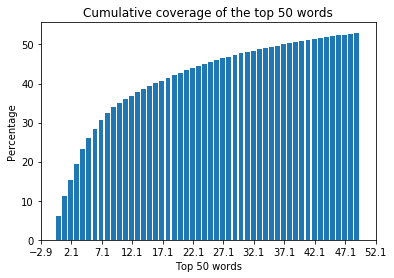

In [31]:
import numpy as np
import matplotlib.ticker as ticker

def visualise_dist(file_dict, up_to):
    width = 10.0
    percentage_map = collect_percentage_map(file_dict, up_to)
    sort_map = {}
    rank = 0
    cum_sum = 0
    # Store cumulative percetage of coverage
    for item in percentage_map:
        rank += 1
        cum_sum += item[1]
        sort_map[rank] = cum_sum
    # How much do the top n words account for?
    print("Total cumulative coverage = %.2f" % cum_sum + "%")
    
    fig, ax = plt.subplots()
    plt.title("Cumulative coverage of the top " + str(up_to) + " words")
    plt.ylabel("Percentage")
    plt.xlabel("Top " + str(up_to) + " words")
    # Build the histogram for the percentages
    plt.bar(range(len(sort_map)), sort_map.values())
    # Label x axis with the ranks of the 1st to n-th most frequent word
    # printing out each 5-th label on the axis
    start, end = ax.get_xlim()
    ax.xaxis.set_ticks(np.arange(start, end+1, 5))
    plt.show()
    
# Explore statistics with a different number of top n words
visualise_dist(pos, 50)   ################### change to 50, 100 and 1000 !!! 

The graph shows that: (1) top $50$ words cumulatively account for $53.02\%$ (i.e., a bit above $50\%$) of all word occurrences; (2) the increase is not linear, and for less frequent words the gain in overall coverage becomes negligible. 

For comparison, top $30$ words account for $47.32\%$ ($>3/5$ of the $50$ words coverage), while top $100$ words account for $61.01\%$ ($<2 *$ the $50$ words coverage) and top $1000$ words account for $83.71\%$ (you can verify these results by changing the number of words considered in the code above). This can provide you with further insights about the use of the data: e.g., it can tell you how you can downsize the vocabulary efficiently without significant loss in performance, or which of the words you can filter out because they are too widely spread or too rare. But more on this later.


# Binary classification: the case of sentiment analysis

In this module, you will implement your first end-to-end NLP application.
Specifically, you will implement a sentiment analysis algorithm and use the IMDB dataset as a test case.

## Classification

*Classification* is the task that deals with sorting many different things into a few distinct categories – or _classes_.
Humans constantly classify things, and are usually quite good at that.
For example, when you read a movie review, you quite often can tell straight away if it is positive and recommends you watch the movie based on several characteristics such as the choice of words, the style of writing, and so on.
But how can machines classify reviews and distinguish positive from negative ones?

A solution is *machine learning*, whereby a classifier is exposed to a large amount of data exemplifying both positive and negative reviews, and automatically learn about their different characteristics.
The basic idea behind how machine can learn to distinguish between positive and negative sentiment is similar to how humans learn to do the same: the more positive reviews you see and recognise, the better you get at recognising them.
For humans, experience comes naturally, and as we are exposed to large amounts of various types of information and knowledge, we constantly learn and improve our classification skills.
Machines can also learn from experience if they are provided with enough data.

Classification is an instance of *supervised learning*. It means that the machine learns under your supervision:

* At first, the machine does not know anything about the positive and negative categories.
Your job is to provide many reviews, labelled as either positive or negative.

* Next, you provide a way for the machine to extract characteristics from the review. For example, you can write a function that extracts the words from the text.
In this step, you tell the machine to consider words as characterstic properties that would help it to distinguish positive from negative sentiment.
These properties, in machine learning terms, are called *features*.
Choosing meaningful and useful features is an essential task called *feature engineering*.

* After that, the machine figures out which features to prioritise based on their discriminative power. For example, by looking at the examples you provided and features you outlined, it might find out that adjectives such as “awesome” are very strong clues that a review expresses positive sentiment.
This process, called *feature weighting*, orders the different features by their ability to distinguish positive from negative reviews.

* Finally, the classifier is ready. You provide new reviews to the classifier which, based on what it has learned, will decide if they are positive or negative.

**Note:** 
>In this case, we treat sentiment analysis as a binary classification task: we consider only two categories – positive and negative.
Since sentiment can be expressed as a value on scale and often is not strictly positive or strictly negative, the task can be solved using multi-class classification (e.g., positive/neutral/negative sentiment, or 1 to 5 stars), regression or ranking.


## Sentiment analysis implementation

There are five steps to implement the sentiment detector:

1. loading the data,
2. preprocessing the data,
3. extracting the features,
4. training the classifier,
5. evaluating.

Note that these steps are typical for any machine learning task. They form the *machine learning pipeline*.


### Step 1: Loading the data

Let's combine positive and negative reviews and assign `pos` and `neg` labels to them.
To that end, use tuples – a data structure consisting of two elements – to store pairs where the first element is the text of the review and the second is its label.


In [32]:
pos.items()

dict_items([('0_9.txt', 'Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High\'s satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers\' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I\'m here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn\'t!'), ('100_7.txt', "Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lig

In [33]:
# add your code here
all_reviews = [(text, "pos") for (review, text) in pos.items()]
all_reviews += [(text, "neg") for (review, text) in neg.items()]

Remember that it is always a good idea to check if your data is loaded correctly.
You can check the size of the data structure (which should be $2000$):


In [34]:
all_reviews

[('Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High\'s satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers\' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I\'m here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn\'t!',
  'pos'),
 ("Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lights and colours, and the 

In [38]:
type(all_reviews)

list

In [39]:
# add your code here
print(len(all_reviews)) #### 1000 pos and 1000 neg!!!!!!!!!!!

2000


Let us separate a portion of the data for training and a portion for testing.

For this, use `train_test_split` from `sklearn.model_decomposition` specify that the test set should contain 20% of the initial entries.

In [40]:
# add your code here
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(all_reviews, test_size=0.2)


### Step 2: Preprocessing the data

You have learned about some text preprocessing steps before, including:

* **Tokenisation** of the text into words.
* Converting all words to **lowercase**.
* **Lemmatisation** of different forms of the same word into the same base form.

There are a couple of other steps to consider: note that certain types of words, like “_the_”, "_with_" and similar are very common in language and as they appear in all types of text – for example, in all reviews – they are unlikely to help you distinguish positive from negative reviews.
Such words are called *stop words*, and in many NLP tasks they can be disregarded.

spaCy has a corpus of stop words for several languages, including English.
You can import and then access the stop word list for English as the code below specifies. Let's also check what stop word filtering does with a short example:


In [43]:
stopwords #--------------- to see the words!!!

{'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'alone',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'front',
 'full',
 'further',
 'get',
 'give',
 'g

In [13]:
from spacy.lang.en.stop_words import STOP_WORDS as stopwords

text = nlp(u'I thought that it was totally fabulous and I totally recommend that you see this masterpiece.')

# add your code to show the lemma of token not in "stopwords"
for token in text:
    if not token.lemma_ in stopwords:
        print(token.lemma_)

NameError: name 'nlp' is not defined

As you can see, this step filters out quite a lot of words. At the same time, note that none of the filtered words are relevant to sentiment classification – they are neither positive nor negative, while those remaining summarise the content of the sentence well.

**Note**:
>`-PRON-` stands for pronoun and covers a wide class of words including "_I_", "_you_", "_this_", etc.

Filtering stop words out helps reduce the vocabulary size and speed up the calculations without harming the performance on the task. However, if you believe that some of the stop words are relevant to the task, you can customise the stop words list by uploading your own ones or filtering out words of your choice.

In addition, you might also consider filtering out punctuation marks and pronouns. Let's combine all these steps together in a method called `spacy_tokenizer`:

In [12]:
### Removing Ponctuation!!!!!!!!!!!!!!!!!!!!!

import string
punctuations = string.punctuation

def spacy_tokenizer(text):
    tokens = nlp(text)
    tokens = [tok.lemma_.lower().strip() if tok.lemma_ != "-PRON-" else tok.lower_ for tok in tokens]
    tokens = [tok for tok in tokens if (tok not in stopwords and tok not in punctuations)]
    return (' '.join(tokens))

print(spacy_tokenizer(u'I thought that it was totally fabulous and I totally recommend that you see this masterpiece.'))

NameError: name 'nlp' is not defined

In [46]:
punctuations

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

The code in `spacy_tokenizer` above essentially filters out all information that is irrelevant for the task at hand, and converts the text in a succinct summary of what is most important to know about the original sentence.

Now, let's apply the preprocessing to our data. You should first initialise the training subset to $80\%$ of the original dataset (or $1600$ reviews), leaving the other $20\%$ (i.e, the other $400$ reviews) for testing. Next, apply preprocessing (`spacy_tokenizer`) to both subsets. Let's store the output of this step in the `data` field for both training and test subsets. The `data` field will be a vector keeping the preprocessed textual content of the reviews.

You will also need a vector of `targets` – labels assigned to the reviews. The targets in the training set will be used by the machine learning model to learn the correspondences between the textual content (`data`) and the label (`target`), while the targets in the test set will be used to check the model predictions against and to evaluate the model performance. Since it will be easier for the machine learning model to deal with numerical targets, let's convert _pos_ label into numerical target of $1$ and _neg_ label into numerical target of $0$:


In [47]:
# add your code here
train_targets = []
test_targets = []

train_data = [spacy_tokenizer(text) for (text, _) in train_set]
test_data = [spacy_tokenizer(text) for (text, _) in test_set]

In [48]:
type(train_data)

list

In [49]:
train_data

["yokai monsters spook warfare yokai daisenso 2005 movie yokai traditional japanese monster folklore alternatively know big monster war ghosts parade yokai installment include teapot freak kappa water imp living brella woman sheek grow extremely gigantic woman second face head dwarf priest enormous gourd like wrist sort whimsical monster derive fairy lore type summer entertainment tokugawa era comparable today 's halloween haunt house freak yesteryear exclusively phony freak ghost goldfish monster dance head umbrella trump create chill hot summer fatcheek woman recreate trick illusion base monster depict medieval scroll design movie bit simple hoky representative historically recreate summer chill endear monster face destroy ancient babylonian vampire demon come japan disguise samurai lord despite japanese apparition bit goofy costume scarsely mask lip speak play poker face charming beautiful cinematography provide cgi film decade view right mood right friend exciting touching yoshiyuk

In [50]:
# add your code here
# Let's convert labels into numerical values
for (text, label) in train_set:
    if label=="pos": train_targets.append(1)
    else: train_targets.append(0)
        

for (text, label) in test_set:
    if label=="pos": test_targets.append(1)
    else: test_targets.append(0)
        
# Check the data is initialised correctly      
print(len(train_data))    # 1600?
print(len(train_targets)) # 1600?      
print(len(test_data))     # 400?       
print(len(test_targets))  # 400? 
print(train_targets[:10]) # print out the targets for the first 10 reviews ############# to check if it is shuffled!!!!!!!!!!!
print(test_targets[:10])  # print out the targets for the first 10 reviews 


1600
1600
400
400
[1, 1, 0, 0, 1, 1, 0, 1, 0, 1]
[0, 1, 0, 1, 0, 0, 1, 1, 1, 1]


### Step 3: Extracting the features

Now, for each word that is not in the stop word or punctuation list, you need to calculate how frequently it occurs in the text. This approach is called the **bag-of-words** (**BOW**), and it allows the classifier to notice that certain keywords may occur in both types of reviews but with different frequencies: for example the word “_fabulous_” is more frequent in positive than in negative reviews. 
We will turn to using [`sklearn`](http://scikit-learn.org/stable/) for extracting the features and training classifiers. `Sklearn`'s `CountVectorizer` performs exactly this – it iterates through the text and counts the number of times the tokens occur in it. Remember that you need to apply it to the preprocessed text, i.e. to the output of `spacy_tokenizer`, so you should pass the `train_data` as an argument to the `CountVectorizer`:


In [51]:
# import CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer

# create an instance of CountVectorizer and apply it to the training data
# call the result X_train_counts
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(train_data)
# Check the dimensionality 
print(X_train_counts.shape)


(1600, 16959)


This code above first collects the vocabulary of _all_ the words used in _all_ the reviews that were not filtered out in the previous step when you performed preprocessing, i.e. they are not stopwords or punctuation marks. Then for each word in this shared vocabulary it assigns a unique index (that is what the `fit` bit of the `fit_transform` function above does) and counts how many times this word occurs in each review (that is what the `transform` bit of the `fit_transform` function above does). As a result, each of the $1600$ reviews in the training set gets assigned a vector of word frequencies – a vector of the length equal to the size of the full shared words vocabulary. 

You can treat `X_train_counts` as a matrix or as a list (array) of review-specific lists (arrays) of word counts. `X_train_counts.shape` prints the dimensionality of this matrix, i.e. _number of reviews_ $\times$ _number of words in the shared vocabulary_. When you print `X_train_counts.shape`, it tells you how many words there are in this shared vocabulary. This number should be around $17K$. 

**Note:**
>Since you shuffle the data before splitting it into training and test set, the size of the shared vocabulary will vary a bit from one split to another.

A typical review will contain a few hundred words, many of which will be stopwords or repetitions, so the number of _unique words_ in each review in not very high, and is certainly much much lower than $17K$ words in the vocabulary. So, as you can imagine, only a small fraction of the shared vocabulary will occur in each particular review and the original matrix will be very sparse. For example, let's print the non-zero word counts for some reviews in the dataset: 


In [52]:
print(X_train_counts[:11]) ############## they are ordered alphabetically!!!!!

  (0, 16868)	6
  (0, 9872)	2
  (0, 14181)	1
  (0, 16386)	1
  (0, 3800)	1
  (0, 151)	1
  (0, 9977)	3
  (0, 15348)	1
  (0, 8132)	2
  (0, 9871)	6
  (0, 5935)	1
  (0, 723)	1
  (0, 8492)	1
  (0, 1688)	1
  (0, 16382)	1
  (0, 6402)	1
  (0, 10893)	1
  (0, 7855)	1
  (0, 7645)	1
  (0, 14925)	1
  (0, 6096)	3
  (0, 8335)	1
  (0, 16431)	1
  (0, 7545)	1
  (0, 8911)	1
  :	:
  (10, 5323)	1
  (10, 11980)	1
  (10, 8735)	1
  (10, 14457)	1
  (10, 2649)	1
  (10, 10080)	1
  (10, 10741)	1
  (10, 16446)	1
  (10, 4333)	1
  (10, 11127)	1
  (10, 15737)	1
  (10, 5528)	1
  (10, 14597)	1
  (10, 6375)	1
  (10, 8742)	1
  (10, 9620)	1
  (10, 9541)	1
  (10, 727)	1
  (10, 2595)	1
  (10, 5629)	1
  (10, 16834)	1
  (10, 8268)	1
  (10, 4167)	1
  (10, 1663)	1
  (10, 976)	1


The code above prints a brief overview of the data with the review index, word index in the vocabulary and the frequency count of this word in the particular review. As you can see, the non-negative words are far from each other judging by their indexes. If you'd like to check what words certain indexes map back to, pick out an index from the print out above and run `count_vect.get_feature_names()[index]` as below:


In [56]:
count_vect.get_feature_names()[16868] ##'yokai'
count_vect.get_feature_names()[9872]  ## 'monsters'
count_vect.get_feature_names()[5729]

'fiend'

If you'd like to take a look into the collected vocabulary of the words with non-zero counts, you can also use the code below:


In [57]:
print(count_vect.inverse_transform(train_data)) ############## they are ordered alphabetically!!!!!

[array(['00', '000', '000s', ..., 'beloved', 'belt', 'belushi'],
      dtype='<U27')]


There are a couple of issues with the raw frequency counts that you calculated above: first of all, longer reviews will on average have higher word counts than shorter reviews, even when they talk about the same movie and express the same sentiment. 
To mitigate this effect, you can divide the number of occurrences of each word in a review by the total number of words in this review – this step will produce **_Term frequency_ (_tf_)** counts.

The second issue to keep in mind is that some very widely used words (e.g., _film_ or _movie_) will occur in many reviews and will be not as discriminative as those that occur only in a small portion of the dataset. 
To alleviate this effect, you can downscale the weights for the words that occur in many reviews in the dataset – this step will produce **_Inverse document frequency_ (_idf_)** counts.

The two steps combined are referred to as **_tf–idf_** for **_Term Frequency times Inverse Document Frequency_** and are a popular technique used in NLP. 

`Sklearn` allows you to perform both modifications in one step with the `TfidfTransformer` in the `sklearn.feature_extraction.text` 


In [58]:
# add your code here to load and apply a TFIDF transformation
# call the restult X_train_tfidf
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
print(X_train_tfidf.shape)


(1600, 16959)


### Step 4: Training a classifier

The next step is to use the data to train a classifier. We will look in two different classifiers – generative probabilistic Naïve Bayes classifier and linear Support Vector Machines classifier.


#### Binary classification with naïve Bayes

For this sentiment detector, you will use a *naïve Bayes* classifier: a simple, yet powerful classification algorithm that is widely applied to binary classification tasks.

The underlying idea behind naïve Bayes is as follows.
The classifier tries to choose the most probable class $\hat{c}$ among the two classes – in this example, among $\mathit{pos}$ and $\mathit{neg}$:

\begin{equation}
c \in \{\mathit{pos}, \mathit{neg}\}
\end{equation}

The classifier tries to predict the class based on what it has learned about the features (presence or frequency of certain words in the reviews of each type):

\begin{equation}
\hat{c} =
\begin{cases}
\mathit{pos} & \text{if } P(\mathit{pos} \mid \mathit{words}) > P(\mathit{neg}\mid\mathit{words}) \\
\mathit{neg} & \text{otherwise}
\end{cases}
\end{equation}

The formula above indicates that the classifier will choose the class
$\hat{c}$ among the two possible classes by looking at which is more likely.
The probability of a review being $\mathit{pos}$ given its content
$\mathit{words}$ is $P(\mathit{pos} \mid \mathit{words})$. Conversely, the
probability of an review being $\mathit{neg}$ given its content $\mathit{words}$
is $P(\mathit{neg} \mid \mathit{words})$.

These probabilities cannot be computed exactly (if you are unsure why, try to think about the limitless amount of possible sequences of words that should be used as features and provide reliable probability estimates for $P(\mathit{pos} \mid \mathit{words})$ and $P(\mathit{neg} \mid \mathit{words})$), but the naïve Bayes classifier
allows to "swap" the conditions around and use the following formula instead:

\begin{equation}
P(c\mid\mathit{words}) = \frac{P(\mathit{words}\mid c)  P(c)}{P(\mathit{words})}
\end{equation}

Putting this new probability estimation in the classifier formula, we obtain:

\begin{equation}
\hat{c} =
\begin{cases}
\mathit{pos} &
  \text{if }
    \displaystyle\frac{P(words \mid pos) P(pos)}{P(words)} > \displaystyle\frac{P(words\mid neg)  P(neg)}{P(words)} \\
\mathit{neg} & \text{otherwise}
\end{cases}
\end{equation}

Note that $P(words)$ appears on both sides of the comparison. Thus, the
formula can be simplified further as:

\begin{equation}
\hat{c} =
\begin{cases}
\mathit{pos} &
  \text{if }
    P(words\mid pos)  P(pos) > P(words\mid neg)  P(neg) \\
\mathit{neg} & \text{otherwise}
\end{cases}
\end{equation}

Essentially, the classifier combines the combination of the general
distribution of pos in the data ($P(\mathit{pos})$) and the evidence it gets
from the words in the review ($P(\mathit{words}\mid \mathit{pos})$) and compares
that combined probability with the neg counterpart.

The *prior probabilities* $P(\mathit{pos})$ and $P(\mathit{neg})$ indicate how likely a review is to be positive or negative without any further information (i.e., without even looking into the texts of the reviews). It is the probability prior to any analysis.
These probabilities are estimated from the data by simply calculating the proportion of pos and neg reviews: for example, for our IMDB dataset, $P(\mathit{pos}) = 1000 / 2000 = 0.50$.

The *conditional probabilities*, $P(\mathit{words}\mid\mathit{pos})$ and $P(\mathit{words}\mid\mathit{neg})$, indicate how likely a set of words $\mathit{words}$ is to appear in a $\mathit{pos}$ or $\mathit{neg}$ review.

The naïve Bayes classifier assumes that each word $w$ occurs in a text independently of all other words – this is a "naive" assumption thus the _naive_ in the name of the classifier, so we can multiply the conditional probabilities for each of the words directly.
This gives the final formula:

\begin{equation}
\hat{c} =
\begin{cases}
\mathit{pos} &
  \text{if }
    \prod_{\mathit{w} \in \mathit{text}} P(w\mid pos)  P(pos) > \prod_{\mathit{w} \in \mathit{text}} P(w\mid neg)  P(neg) \\
\mathit{neg} & \text{otherwise}
\end{cases}
\end{equation}

#### Using the naïve Bayes classifier

Now, let's use the Naive Bayes classifier as provided by the `sklearn`:


In [60]:
# add your code to load MultinomialNB from sklearn.naive_bayes
# then initialise and fit it to the X_train_tfidf and train_targets
from sklearn.naive_bayes import MultinomialNB

# Initialise the classifier and use fit function 
# to make the classifier learn the correspondences
# between the features in the training set and the targets
clf = MultinomialNB().fit(X_train_tfidf, train_targets)

# apply the same transformation you applied on the training set on the test set
# then apply the NB classifier to the test data
# The transform function maps the words in the test 
# set onto the same vocabulary and counts frequencies
X_test_counts = count_vect.transform(test_data)
X_test_tfidf = tfidf_transformer.transform(X_test_counts)

# Apply the classifier to the test set 
# set and print out some results
predicted = clf.predict(X_test_tfidf)

# now you can look at the result and compare with the ground truth
for (text, pred, truth) in list(zip(test_data, predicted, test_targets))[:10]:
    print("{} => pred: {} <+> truth: {}".format(text[:75], pred, truth))


goethe point try pass negative judgement aspire objective great effect la m => pred: 1 <+> truth: 0
interested obtain copy film read description telecast cbs november 30 2003  => pred: 1 <+> truth: 1
want reason remake high sierra bogart bogart play jack palance play dramati => pred: 0 <+> truth: 0
film complain obvious construction plot petzold 's game play rule genre nic => pred: 1 <+> truth: 1
rent curious yellow video store controversy surround release 1967 hear seiz => pred: 0 <+> truth: 0
hurting stop want version christmas carol movie story fall try movie better => pred: 1 <+> truth: 0
wrong amazing ramones crime dead remind dennis leary joke great musician di => pred: 1 <+> truth: 1
story universal century gundam universe present refreshing new look war ear => pred: 1 <+> truth: 1
normally like series predictable tend boring dull fast series play story fo => pred: 0 <+> truth: 1
busy phillips hell performance comedic dramatic erika christensen good busy => pred: 1 <+> truth: 1


The code in this and the previous section performs a number of steps including word counting, tf-idf transformations and training a classifier, in a number of lines. `Sklearn` allows to pack the counting, transfroming and classifying steps in a much more compact way which takes only a few lines of code and is much simpler. The code below uses `pipeline` of tools and performs the same actions as above:


In [62]:
from sklearn.pipeline import Pipeline
text_clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', MultinomialNB())
                    ])

text_clf.fit(train_data, train_targets)
predicted = text_clf.predict(test_data)

In [64]:
#predicted

### Step 5: Evaluating the classifier

Finally, how do you know if your classifier is performing well on the task? 

You can look at the `accuracy_score` from `sklearn.metrics` which gives you the overall accuracy of comparing `test_targets` with `predicted`

In [65]:
# add your code here
from sklearn.metrics import accuracy_score

print(accuracy_score(test_targets, predicted))


0.89


Depending on the particular data split, the results might vary. For the Naive Bayes classifier the accuracy should be around $0.90$. This means, the classifier predicts the sentiment correctly $90\%$ of the time despite a couple of simplifying assumptions about the data! This looks good enough, but doesn't provide you with all the information you need to be able to assess the performance. For example, is your classifier equally good in detecting a positive review as it is in detecting a negative review? When it fails, is it usually on a positive or a negative one?

A number of further evaluation metrics give you insight into these matters. The very first step is to print a _confusion matrix_ – a table that will exhaustively describe the predictions of your classifier on the test set. The rows represent the counts in the actual data set and the columns – the predictions of your classifier. The counts themselves are traditionally referred to as _true negatives_ ($TN$), _false negatives_ ($FN$), _false positives_ ($FP$), and _true positives_ ($TP$):

|                 | Pred neg  | Pred pos  |
| -----------     |:---------:|:---------:|
| **Actual neg**  | $TN$      | $FP$      |
| **Actual pos**  | $FN$      | $TP$      |

`confusion_matrix` can also be imported from `sklearn.metrics

In [39]:
# add your code here to show the confusion matrix
from sklearn.metrics import confusion_matrix

print(confusion_matrix(test_targets, predicted))


[[179  17]
 [ 27 177]]


Next, let's calculate, for each class (i.e. positive and negative), _precision_, _recall_ and _$F_{1}$-score_:

* _Precision_ shows how reliable your classifier's prediction for a certain class is – i.e., when it predicts that a review is positive, how certain can you be that it is indeed positive? Precision is estimated as $P=\frac{TP}{TP+FP}$
* _Recall_ shows how wide a coverage your classifier has for a particular class – i.e., how many of the actually positive reviews can it identify in the dataset? Recall is estimated as $R=\frac{TP}{TP+FN}$
* Quite often there will be a certain interplay between precision and recall: e.g., a classifier that labels all reviews as positive has perfect ($100\%$) recall on positive class, but very poor precision on positive class and $0\%$ recall on negative class; on the countrary, a classifier that labels only a few actually positive reviews as positive and misses many other actually positive reviews will have a very high precision on positive class, but low recall on positive class and low precision on negative class. Depending on the application, you might want to optimise for precision, recall or both.
* _$F_{1}$-score_ is a harmonic mean between precision and recall and takes both into account, providing you with a balanced summary of the classifier performance on the class. It is estimated as $F_{1}=2 \times \frac{P \times R}{P + R}$

`Sklearn`'s metrics allow you to estimate the performance of your classifier on both classes with a single line of code.


In [40]:
# add your code here to show the classification report
from sklearn.metrics import classification_report
print(classification_report(test_targets, predicted))


              precision    recall  f1-score   support

           0       0.87      0.91      0.89       196
           1       0.91      0.87      0.89       204

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400



#### Optional extension:

The code above provides you with a "skeleton": it shows how to initialise the classifier, apply it to the data and evaluate classifier's performance. Now, [`sklearn`](http://scikit-learn.org/stable/supervised_learning.html#supervised-learning) comes with a wide variety of classifiers suitable for binary classification. So far, you have only experimented with one – Naive Bayes. Explore other classifiers and compare the results.

For example, you may look into [Linear Support Vector Classification](http://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC) and do the exact same thing as we did before.

* import `LinearSVC` from `sklearn.svm` and apply it after `CountVectorizer` and `TfidfTransformer`
* check the performance


In [41]:
# add your code here
from sklearn.svm import LinearSVC

# Initialise a pipeline with a classifier of your choice
text_clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', LinearSVC())])

# Train the classifier and predict
text_clf.fit(train_data, train_targets)  
predicted = text_clf.predict(test_data)

# Evaluate the performance
print(accuracy_score(test_targets, predicted))
print(confusion_matrix(test_targets, predicted))
print(classification_report(test_targets, predicted))


0.9025
[[176  20]
 [ 19 185]]
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       196
           1       0.90      0.91      0.90       204

    accuracy                           0.90       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.90      0.90      0.90       400



or into linear classifiers with [Stochastic Gradient Descent training](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html). 


In [42]:
from sklearn.linear_model import SGDClassifier

# Initialise a pipeline with a classifier of your choice
text_clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', SGDClassifier(loss='hinge', penalty='l2',
                                           alpha=1e-3, max_iter=50, tol=1e-3,
                                           random_state=42,)),
])

# add your code to train and test the model
# Train the classifier and predict
text_clf.fit(train_data, train_targets)  
predicted = text_clf.predict(test_data)

# Evaluate the performance
print(accuracy_score(test_targets, predicted))
print(confusion_matrix(test_targets, predicted))
print(classification_report(test_targets, predicted))


0.905
[[174  22]
 [ 16 188]]
              precision    recall  f1-score   support

           0       0.92      0.89      0.90       196
           1       0.90      0.92      0.91       204

    accuracy                           0.91       400
   macro avg       0.91      0.90      0.90       400
weighted avg       0.91      0.91      0.90       400



Unlike Naive Bayes classifier, `SGDClassifier` classifier has a number of parameters to specify. How would you know which settings to use?

One way would be to try out different parameter combinations and compare the results. Luckily, you don't need to do that yourself and can use `sklearn`'s GridSearch functionality: it will run an exhaustive search of the best parameters on a grid of possible values. 

For example, let's check whether using single words (unigrams, range `(1, 1)`) or pairs of words (bigrams, range `(1, 2)`, with or without idf, and with a penalty parameter _alpha_ of either $0.01$ or $0.001$ for the linear SVM is best. Let's then print out the best parameter combination with the best achieved accuracy `gs_clf.best_score_`:


In [43]:
from sklearn.model_selection import GridSearchCV

parameters = {'vect__ngram_range': [(1, 1), (1, 2)],
              'tfidf__use_idf': (True, False),
              'clf__alpha': (1e-2, 1e-3),
              'clf__penalty': ('l1', 'l2')}

# add your code to apply a GridSearchCV on the pipeline
gs_clf = GridSearchCV(text_clf, parameters)
gs_clf = gs_clf.fit(train_data, train_targets)

predicted = gs_clf.predict(test_data)

# Evaluate the performance
print(accuracy_score(test_targets, predicted))
print(confusion_matrix(test_targets, predicted))
print(classification_report(test_targets, predicted))

for param_name in sorted(parameters.keys()):
    print("{}: {}".format(param_name, gs_clf.best_params_[param_name]))


0.905
[[174  22]
 [ 16 188]]
              precision    recall  f1-score   support

           0       0.92      0.89      0.90       196
           1       0.90      0.92      0.91       204

    accuracy                           0.91       400
   macro avg       0.91      0.90      0.90       400
weighted avg       0.91      0.91      0.90       400

clf__alpha: 0.001
clf__penalty: l2
tfidf__use_idf: True
vect__ngram_range: (1, 1)


#### Another optional extension:

Remember that words belong to different categories – words like _film_ are called nouns, while words like _good_ are called adjectives. In the beginning of the session, you learner how to extract words by their part of speech (PoS) label, and we also discussed that words of certain parts of speech might be more informative for the task of sentiment analysis. Will taking into account only these discriminative words help classification? 

Modify the code for `spacy_tokenizer` to return words of only certain PoS and then rerun your classifiers:


In [44]:
# Modify the code to return only words of certain PoS
def spacy_tokenizer(text):
    tokens = nlp(text)
    tokens = [tok.lemma_.lower().strip() if tok.lemma_ != "-PRON-" else tok.lower_ for tok in tokens]
    tokens = [tok for tok in tokens if (tok not in stopwords and tok not in punctuations)]
    return (' '.join(tokens))

# Unsupervised machine learning tasks: clustering

In the previous module you tried to teach the computer to distinguish between the classes of texts.
For that, you always provided the computer with a set of examples for each of these classes and expected it to learn the distinctive properties defining each of the classes.
Such approaches are generally referred as *supervised* machine learning tasks and they rely on:

* Availability of clearly distinguishable classes of objects
* You providing the computer with examples for each of the classes

But what if you don't know the particular categories that exist in your data?
Or what if you want to explore the inherent relations between the data points in your dataset?

For example, suppose you want to find news articles that are similar to the one you are currently reading.
At the same time, you might not care which category the article belongs to.
For example, Google News, on top of the articles belonging to the same topic, notifies you of other similar articles:

![Google News by clusters](figures/google_news_clusters.png)

Machine learning approaches aimed at detecting similarities between data points without being specifically told which data points should be considered as similar (belonging to the same class) are called *unsupervised* machine learning approaches.
_Clustering_ is one of such approaches most widely used in practice.

In this module, you will learn how to detect clusters in a set of documents based on the similarity of the documents content.

## K-means clustering algorithm

K-means clustering algorithm is based on very simple reasoning.
Suppose you have 9 data points which are located in your vector space as follows:

![Clustering step 1](figures/clust1.png)

We can only visualise 2 dimensions here, but you can imagine that these data points "live" in a multi-dimensional vector space, like, for example, the one from the previous module.
In fact, your 9 data points visualised here may be 9 documents from different classes defined by a thousand of words and therefore living in a 1000-dimensional space of which you only see two dimensions in this figure.

Now you assume that in this dataset you have documents from 3 classes, or _clusters_.
The first step in this algorithm would be to identify the _centroids_ – the central data points within each of your 3 clusters such that all the other points from the same clusters would be located close to these centroids.
You can pick these central points at random, or following some heuristics.
For example, let's assume that you have chosen the following 3 data points as centroids for your 3 clusters:

![Clustering step 2](figures/clust2.png)

Next, for each of the other data points you measure which of the centroids is the closest one.
More precisely, the goal of the algorithm is to assign each data point to one of these three clusters $C_{i}$ so that the within-cluster sum of squares,
or the sum of distances from each data point within the cluster to the centroid of the cluster, is minimised:

\begin{equation}
arg min_{C} = \sum_{i=1}^{3} \sum_{x \in C_{i}} \|x - cent_{i}\|^{2}
\end{equation}

![Clustering step 3](figures/clust3.png)

Once such clustering of the data points that minimises the within-cluster distances for each of the data points within each of the clusters is identified,
the data points are assigned to the cluster and the partitioning of the space will look as follows:

![Clustering step 4](figures/clust4.png)

After this step, the algorithm recalculates the centroids – central points within each of the clusters – such that they are equidistant from all the points within the cluster.
In the figure below the squares are the new centroids.

![Clustering step 5](figures/clust5.png)

The algorithm then runs over all the data points again to make sure the cluster assignment is correct.
If it identifies any inconsistencies and finds that some data points are now closer to a new centroid from a different cluster, it re-assigns the data points and recalculates centroids again.
This process is repeated until _convergence_, or in other words, until data points allocation does not change anymore from one run of the algorithm to the next.
Therefore, by the end of this cycle the space should be unambiguously partitioned into clusters as in the figure above.



## Implementing clustering with Python

You will use `sklearn`'s [`KMeans`](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) clustering implementation.


### Step 1: Importing the libraries

As before, let's start by importing all the libraries that your program will use:


In [1]:
import numpy as np
from sklearn.decomposition import TruncatedSVD #1
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer #2
from sklearn.pipeline import make_pipeline #3
from sklearn.preprocessing import Normalizer #4
from sklearn.cluster import KMeans #5
from sklearn import metrics #6

1. In this module, you will experiment with dimensionality reduction – an efficient technique that allows you to reduce the number of vector dimensions while keeping the performance at a comparably high level.
You will use `sklearn`'s [`TruncatedSVD`](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html).
2. As before, import _tf-idf_ functionality.
3. [`make_pipeline`](http://scikit-learn.org/stable/modules/generated/sklearn.pipeline.make_pipeline.html) will help you to combine the tasks to be applied to your data.
4. [`Normalizer`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.Normalizer.html) will help you to unit normalise your vectors to make them comparable across the dataset.
5. Import `KMeans` clustering algorithm.
6. Import the metrics to evaluate your algorithm.


### Step 2: Loading the data

Now let's load the data. You can re-use some of the code you've written before for the supervised classification to initialise the data:


In [4]:
pos = init_dict("data/imdb_dataset/pos/")
neg = init_dict("data/imdb_dataset/neg/")
pos

## print dict
for key,val in pos.items():
    print(key, "=>", val)

## only keys
poskeys = pos.keys()
print(poskeys)

## only values
print("Values:")
for keytext in pos:
    text = pos[keytext]
    print(text)

0_9.txt => Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High's satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I'm here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn't!
100_7.txt => Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lights and colours, and th

538_10.txt => Return to Cabin by the Lake is Perhaps one of The Few Sequels that Can Live up to The Original. It Had Black Humor, Good Suspense, Nice Looking Girls, and Of Course, a Psycho Killer. What are We Missing? I Think Nothing. Except we Are Left with a Small Amount of Gore and Nudity because It Was Made for Television. Besides Being one Of The Best Sequels, it is one of The Best Thrillers to Watch as a Family. Recommended for Everyone.
539_10.txt => The first was good and original. I was a not bad horror/comedy movie. So I heard a second one was made and I had to watch it.  What really makes this movie work is Judd Nelson's character and the sometimes clever script. A pretty good script for a person who wrote the Final Destination films and the direction was okay. Sometimes there's scenes where it looks like it was filmed using a home video camera with a grainy-look.  Great made-for-TV movie. It was worth the rental and probably worth buying just to get that nice eerie feeling 

886_8.txt => This was one of the DVD's I recently bought in a set of six called "Frenchfilm" to brush up our French before our planned holiday in beautiful Provence this year. So far, as well as improving our French we have considerably enhanced our appreciation of French cinema.  What a breath of fresh air to the stale, predictable, unimaginative, crash bang wallop drivel being churned out by Hollywood. What a good example for screenplay writers, actors, directors and cinematographers to follow. It was so stimulating also to see two identifiable characters in the lead roles without them having to be glossy magazine cover figures.   The other thing I liked about this film was the slow character and plot build up which kept you guessing as to how it was all going to end. Is there any real good in this selfish thug who continually treats his seemingly naÃ¯ve benefactor with the type of contempt that an ex-con would display? Will our sexually frustrated poor little half deaf heroine prove

In [8]:
print("Values:",)
for year in released:
    releases= released[year]
    print(releases)

Values:


NameError: name 'released' is not defined

In [9]:
all_reviews = [(text, "pos") for (review, text) in pos.items()]
all_reviews += [(text, "neg") for (review, text) in neg.items()]

all_reviews
#type(all_reviews)

[('Bromwell High is a cartoon comedy. It ran at the same time as some other programs about school life, such as "Teachers". My 35 years in the teaching profession lead me to believe that Bromwell High\'s satire is much closer to reality than is "Teachers". The scramble to survive financially, the insightful students who can see right through their pathetic teachers\' pomp, the pettiness of the whole situation, all remind me of the schools I knew and their students. When I saw the episode in which a student repeatedly tried to burn down the school, I immediately recalled ......... at .......... High. A classic line: INSPECTOR: I\'m here to sack one of your teachers. STUDENT: Welcome to Bromwell High. I expect that many adults of my age think that Bromwell High is far fetched. What a pity that it isn\'t!',
  'pos'),
 ("Scott Bartlett's 'OffOn' is nine minutes of pure craziness. It is a full-frontal assault of psychedelic, pulsating, epilepsy-inducing flashing lights and colours, and the 

In [10]:
dir(all_reviews)

['__add__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__imul__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__mul__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__reversed__',
 '__rmul__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'append',
 'clear',
 'copy',
 'count',
 'extend',
 'index',
 'insert',
 'pop',
 'remove',
 'reverse',
 'sort']

In [15]:
from random import shuffle
shuffle(all_reviews) ######################## SHUFFLE!!!

labels = []

data = [spacy_tokenizer(text) for (text, label) in all_reviews]
# Let's convert labels into numerical values

In [16]:
data

['review old vhs tape come tv john denver muppets christmas computer look find dvd version buy disappoint able find dvd air 1979 delightful record cd love buy dvd version tape old picture quality pretty good fading sound good cd song cd fan john denver muppets dvd good seller cd wonderful chritmas collection song album good find record player play',
 "year ago watch matador cinema love movie obviously totally impression pierce brosan 's magnificent role yesterday catch movie tv look bit deeper certain movie special love man brosnan lift grade opinion amazing performance julian noble tired hit man friend soon julian meet danny wright greg kinnear mexico city man bad luck son die accident job sure wife bean hope davis like movie like crime movie big touch humor humor come brosnan tell joke dwarf big d .... favorite line movie look like bangkok hooker sunday morning navy 's left town brosnan charm drink margarita usually like greg typical american face kinnear role loser lively plenty peo

In [17]:
for (text, label) in all_reviews:
    if label=="pos": labels.append(1) ################# we will use it only for EVALUATION, not to classify the reviews!!
    else: labels.append(0)

In [18]:
type(labels)

list

In [19]:
        
# Check the data is initialised correctly      
print("Data:")
print(str(len(data)) + " reviews on "
      + str(np.unique(labels).shape[0]) + " categories\n") #1

print("Labels: ")
print(labels[:10])
gs_clusters = np.unique(labels).shape[0] #2
print("Gold standard clusters: " + str(gs_clusters))

Data:
2000 reviews on 2 categories

Labels: 
[1, 1, 1, 0, 1, 0, 1, 0, 0, 1]
Gold standard clusters: 2


1. Make sure the data is uploaded correctly by checking the total number of documents and the number of categories.
2. Store the number of unique categories in your data as _gold standard_ clusters (or _ground truth_ labels).
When you implement your clustering algorithm, you can specify the number of clusters the algorithm should aim for
as equal to the number of gold standard clusters in the data. For example, for this application you have 2 gold standard clusters – _positive_ and _negative_ reviews.
You can also evaluate your algorithm by comparing against the clusters that actually exist in the data.


### Step 3: Building vectors

Now, let's convert the reviews into vector representation.
You did this in the previous module using `TfidfVectorizer`.
Let's add more functionality here:

* you will specify the number of dimensions for the original vectors – the number of most frequent words that will be used to build vectors
* you will also apply Singular Value Decomposition – a technique that allows to reduce vector dimensionality keeping only the most relevant information in the vectors.


In [20]:
def transform(orig_data, orig_dim, red_dim):
    vectorizer = TfidfVectorizer(min_df=2, max_df=0.5,
                                 max_features=orig_dim,
                                 stop_words='english',
                                 use_idf=True) #1
    trans_data = vectorizer.fit_transform(orig_data)

    print("\nOriginal data contains: " + str(trans_data.shape[0]) +
          " with " + str(trans_data.shape[1]) + " features")

    svd = TruncatedSVD(red_dim) #2
    normalizer = Normalizer(copy=False)
    lsa = make_pipeline(svd, normalizer)

    return lsa.fit_transform(trans_data), vectorizer, svd

1. `min_df` and `max_df` set cut-off thresholds on the words that should be used to build vectors based on their document frequency.
You also specify the number of words that should be used by setting the `max_features` to the value of the `orig_dim` argument. For more information on the parameter settings, check [TfidfVectorizer documentation](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html). Note the difference between setting the thresholds to an integer value (absolute number of documents) and setting it to a float value (proportion of documents).
2. Use `TruncatedSVD` to reduce the dimensionality to the specified number of $n$ dimensions. `TruncatedSVD` implementation from the `sklearn` library will help identify the most informative $n$ dimensions in the original vectors.
This should make your computations on the vector space more efficient while keeping performance at the high level. 

Let's call this function on your data.
Specify the original number of dimensions to some big value, for example 10000 words,
and the number of dimensions to reduce to to 300 which is the dimensionality frequently used in NLP tasks.


In [21]:
# add your code here
trans_data, vectorizer, svd = transform(data, 10000, 300)
print("\nReduced data contains: " + str(trans_data.shape[0]) +
        " with " + str(trans_data.shape[1]) + " features")



Original data contains: 2000 with 10000 features

Reduced data contains: 2000 with 300 features


### Step 4: Applying clustering algorithm

Now, let's apply the clustering algorithm to the data.

In the same spirit as before, you can create it with `KMeans` specifying `n_clusters`


In [22]:
# add your code here
km = KMeans(n_clusters=2)

km.fit(trans_data)


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

### Step 5: Evaluation

Once you have applied clustering algorithm to your data, you need to evaluate how well it performs in terms of identifying clusters.
Recall that for this data you know which groups the data points (movie reviews with different sentiment) should belong to.
The particular labelling does not matter here as you don't try to assign the labels like _positive_ or _negative_ to the reviews.
What does matter, though, is how many of the _positive_ movie reviews end up clustered together with the other positive reviews, and how many – with the _negative_ reviews.

Therefore, to evaluate the clustering algorithm, you can make use of the following measures:

* *Homogeneity* – a measure that evaluates if each of the clusters contains _only_ data points from a single class (note the similarity to _precision_ for classification algorithms).
* *Completeness* – a measure that tells if _all_ the data points from a particular class are elements of the same cluster (note the similarity to _recall_ for classification algorithms).
* You may note that *homogeneity* and *completeness* are complementary to each other.
*V-measure* is the harmonic mean between the two that allows to take both into account (note the similarity to $F_{1}$ _score_:
\begin{equation}
v = 2 \times \frac{homogeneity \times completeness}{homogeneity + completeness}
\end{equation}

Let's add the method `evaluate` that will report all these metrics
and will also help you extract the most discriminative features (words) that are used by the algorithm to identify each cluster:


In [23]:
def evaluate(km, labels, svd):
    print("Clustering report:\n") #1
    print("* Homogeneity: " + str(metrics.homogeneity_score(labels, km.labels_)))
    print("* Completeness: " + str(metrics.completeness_score(labels, km.labels_)))
    print("* V-measure: " + str(metrics.v_measure_score(labels, km.labels_)))

    print("\nMost discriminative words per cluster:")
    original_space_centroids = svd.inverse_transform(km.cluster_centers_)
    order_centroids = original_space_centroids.argsort()[:, ::-1]

    terms = vectorizer.get_feature_names()
    for i in range(gs_clusters):
        print("Cluster " + str(i) + ": ")
        cl_terms = ""
        for ind in order_centroids[i, :50]: #2
            cl_terms += terms[ind] + " "
        print(cl_terms + "\n")

1. Report the clustering algorithm performance using the 3 metrics described above.
2. Extract 50 most discriminative words per cluster.

Now if you call this method using the 2 sentiment clusters as specified above:


In [24]:
km
#labels
#svd

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [25]:
evaluate(km, labels, svd)

Clustering report:

* Homogeneity: 0.23529670103166592
* Completeness: 0.25130992525145684
* V-measure: 0.24303983198854875

Most discriminative words per cluster:
Cluster 0: 
bad like watch think scene look time horror plot character thing guy funny people know kill acting want way waste come story try actor pretty minute stupid killer feel end act laugh effect line money girl lot script actually 10 terrible budget original boring big let little hour man kid 

Cluster 1: 
story love great like time character life watch play think actor people scene star way know year man come end work performance look role little new cast real thing young feel world woman director old series use family want lot plot comedy big wonderful interesting music child excellent long girl 



**Quiz:**

>Can you guess which cluster belongs to which of the sentiment groups by the words extracted?

### Optional extension:

Remember that the words that are most discriminative for sentiment classification are _adjectives_ and _adverbs_. Modify your code so that it only takes words of specified PoS into account.
